# Project Group - 14

# Research question: - Google Mobility Relative Questions

Members (Student numbers): Max, Li(5944058);Mingyan, Jin(6050972);Heran, Zhao(5925320) 

# Research Objective

*Requires data modeling and quantitative research in Transport, Infrastructure & Logistics*

# State celection

As COVID-19 spreads in the United States, the number of confirmed diagnoses and deaths shows significant variation by state. First we need to start by analyzing the `US_Covid.csv` data to select the state with the worst case of new crowns. In our study we select New York to move into further study, because the number of deaths in New York due to covid was the highest state in USA, 2021.

# Data analysis of the correlation between covid and mobility

`US_Mobility2021.csv` is the 2021 U.S. Transportation Mobility data, which contains statistics for each state for six daily traffic situations, which are `retail and recreation percent change`，`grocery and pharmacy percent change`，`parks percent change`，`transit stations percent`，`workplaces percent change`，`residential percent change`.

Using data from New York state and state of California, US, to:
1. Process the data and collect only data we need, for instance, infected numbers in US_Covid dataset, six columns of data compare to the baseline in US_Mobility data
2. Visualize the data and make it interactable
3. Find the story behind the data using correlationship heatmap and then present the correlated data with line graph.We want to comprehensively analyze the impact of a large-scale epidemic on the travel of urban residents. With these correlation analyses, it is possible to better predict residents' actions, thereby organizing transportation resources, aid resources, and travel policies more effectively, which plays an important role in the potential recurrence of the epidemic in the future. Therefore, the correlation analysis between mobility and COVID-19 will focus on the possible changes in traffic caused by COVID-19 infection, such as whether COVID-19 infection will affect the frequency of commuting to work, whether it will affect the frequency of going to the park, whether it will make residents stay at home longer, and so on.

# Contribution Statement

*Be specific. Some of the tasks can be coding (expect everyone to do this), background research, conceptualisation, visualisation, data analysis, data modelling*

**Max, Li**:

**Mingyan, Jin**:

**Heran, Zhao**:

# Data Used

The main data examined by our group are statistics on the distribution of covid in U.S. in different situations in different states in 2021.

google mobility data: https://www.google.com/covid19/mobility/

covid infected data: https://github.com/owid/covid-19-data/blob/master/public/data/hospitalizations/locations.csv 

# Data Pipeline

not sure about what this part need us to do

# import of Libraries

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import plotly.graph_objs as go
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from IPython.display import display, Markdown

# Data import and data processing 

In [3]:
# Load the data
dfcovid = pd.read_csv('US_Covid.csv')
dfcovid['date'] = pd.to_datetime(dfcovid['date'])
dfcovid = dfcovid.sort_values(by='date')
dfcovid.head()

,state,date,critical_staffing_shortage_today_yes,critical_staffing_shortage_today_no,critical_staffing_shortage_today_not_reported,critical_staffing_shortage_anticipated_within_week_yes,critical_staffing_shortage_anticipated_within_week_no,critical_staffing_shortage_anticipated_within_week_not_reported,hospital_onset_covid,hospital_onset_covid_coverage,...,previous_day_admission_pediatric_covid_confirmed_5_11_coverage,previous_day_admission_pediatric_covid_confirmed_unknown,previous_day_admission_pediatric_covid_confirmed_unknown_coverage,staffed_icu_pediatric_patients_confirmed_covid,staffed_icu_pediatric_patients_confirmed_covid_coverage,staffed_pediatric_icu_bed_occupancy,staffed_pediatric_icu_bed_occupancy_coverage,total_staffed_pediatric_icu_beds,total_staffed_pediatric_icu_beds_coverage,Demo | State Geographic Boundaries
31596,LA,2020-01-01,0,0,1,0,0,1,NaN,0,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
30836,MT,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
129,NC,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
32307,PR,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN
29601,MN,2020-01-01,0,0,1,0,0,1,0.0,1,...,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN


In the scope of our research project, our primary emphasis revolves around the analysis of crucial statistics, specifically concerning the following key metrics: the total count of adult patients hospitalized with confirmed cases and the total number of fatalities.

Fistly we write two pieces of code by using choropleth from plotly express, which is about the animation of the distribution of the number of people total adult patients hospitalized confirmed and deaths in each state in the United States in 2021. 

In [4]:
fig = px.choropleth(dfcovid,
                   locations='state', 
                   locationmode='USA-states',
                   color='total_adult_patients_hospitalized_confirmed_covid',
                   hover_name='state',
                   animation_frame='date',
                   title='COVID hospitalized comfirmed by State over Time',
                   color_continuous_scale='YlGnBu',
                   scope='usa'
                  )

fig.show()

In [5]:
fig = px.choropleth(dfcovid,
                   locations='state', 
                   locationmode='USA-states',
                   color='deaths_covid',
                   hover_name='state',
                   animation_frame='date',
                   title='COVID Deaths by State over Time',
                   color_continuous_scale='YlGnBu',
                   scope='usa'
                  )

fig.show()

Then we analyzed the two sets of data separately.

first with a line graph of the overall number of diagnoses in the U.S. despite time.

In [6]:
fig = px.line(dfcovid, x='date', y='total_adult_patients_hospitalized_confirmed_covid', 
              title='COVID-19 Confirmed Cases Over Time')

fig.show()

January, August 2021 and early 2022 can be seen as the Covid explosion period.

And then with a pie chart of the distribution of deaths by state.

In [7]:
fig = px.pie(dfcovid, 
             names='state',
             values='deaths_covid',
             title='COVID-19 Deaths by State') 

fig.update_traces(textinfo='none')

fig.show()

The four states with the most deaths are New York, California, Texas and Florida.

Based on our comprehensive statistical examination of the data mentioned earlier, our research team opted to focus our attention on New York. This choice was made due to New York's status as a highly representative state during the pandemic.

In [8]:
# # Replace 'state' with the correct column name 'state_code' in the filter
dfcovid = dfcovid[(dfcovid['state'] == 'NY')  & #Only focus on New York
                  (dfcovid['date'] >= '2021-01-01') & 
                  (dfcovid['date'] <= '2021-12-31')]

# # Extract the 'total_adult_patients_hospitalized_confirmed_covid' column for NY
dfcovid = dfcovid[['state', 'date', 'total_adult_patients_hospitalized_confirmed_covid', 'deaths_covid']]
# # Convert 'date' to datetime format for proper sorting

dfcovid.set_index('date', inplace=True)
dfcovid = dfcovid.sort_values(by='date')

dfcovid_filter=dfcovid[['total_adult_patients_hospitalized_confirmed_covid', 'deaths_covid']]
# # Sort the DataFrame by 'date'
dfcovid.head()

,state,total_adult_patients_hospitalized_confirmed_covid,deaths_covid
date,,,
2021-01-01,NY,7926.0,103.0
2021-01-02,NY,8099.0,114.0
2021-01-03,NY,8406.0,142.0
2021-01-04,NY,8636.0,115.0
2021-01-05,NY,8723.0,131.0


# Data Processing

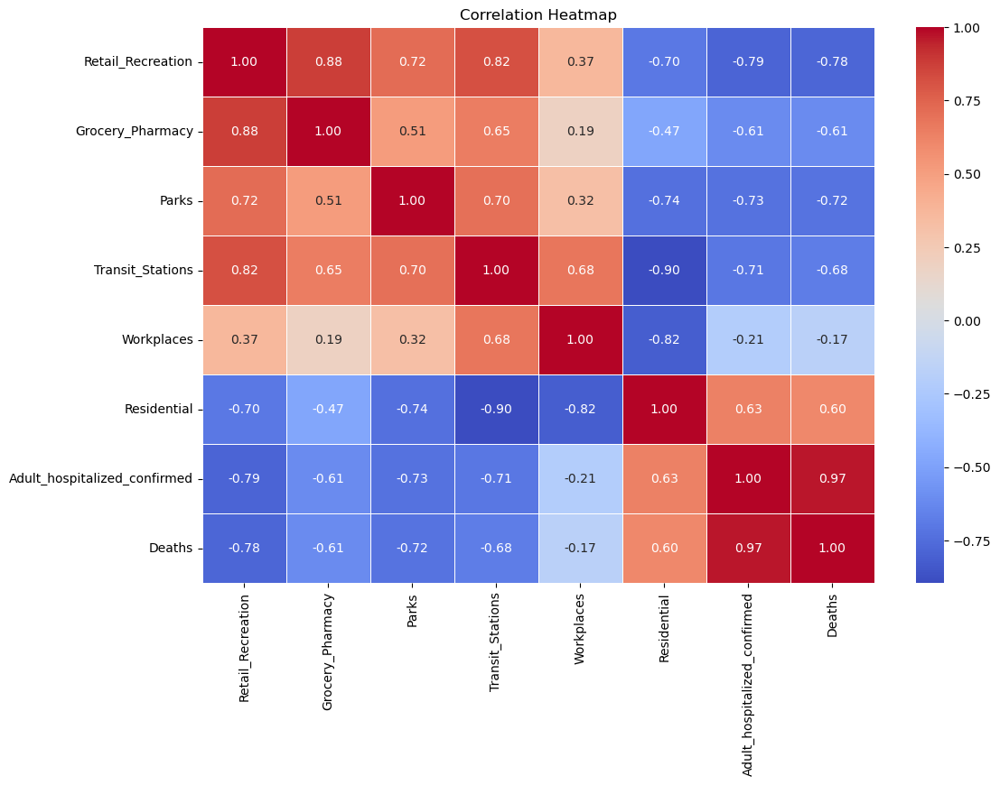

,Retail_Recreation,Grocery_Pharmacy,Parks,Transit_Stations,Workplaces,Residential,Adult_hospitalized_confirmed,Deaths
Retail_Recreation,1.000000,0.880804,0.715109,0.818977,0.365272,-0.695841,-0.786249,-0.783628
Grocery_Pharmacy,0.880804,1.000000,0.514522,0.647740,0.189574,-0.474913,-0.607726,-0.606970
Parks,0.715109,0.514522,1.000000,0.700282,0.322325,-0.736802,-0.730443,-0.722042
Transit_Stations,0.818977,0.647740,0.700282,1.000000,0.678384,-0.895651,-0.710460,-0.680441
Workplaces,0.365272,0.189574,0.322325,0.678384,1.000000,-0.819535,-0.207193,-0.173417
Residential,-0.695841,-0.474913,-0.736802,-0.895651,-0.819535,1.000000,0.629891,0.603296
Adult_hospitalized_confirmed,-0.786249,-0.607726,-0.730443,-0.710460,-0.207193,0.629891,1.000000,0.965070
Deaths,-0.783628,-0.606970,-0.722042,-0.680441,-0.173417,0.603296,0.965070,1.000000


In [14]:
## Calculate and visualize the correlation matrix

# Import US_Mobility data 
dfmobi = pd.read_csv('US_Mobility2021.csv')
dfmobi.head()
selected_columns = ['place_id', 'date', 
                    'retail_and_recreation_percent_change_from_baseline',
                    'grocery_and_pharmacy_percent_change_from_baseline',
                    'parks_percent_change_from_baseline',
                    'transit_stations_percent_change_from_baseline',
                    'workplaces_percent_change_from_baseline',
                    'residential_percent_change_from_baseline']


dfmobi['date'] = pd.to_datetime(dfmobi['date'])                    
dfmobi=dfmobi[selected_columns]
dfmobi= dfmobi[(dfmobi['place_id'].isin(['ChIJqaUj8fBLzEwRZ5UY3sHGz90'])) & 
                  (dfmobi['date'] >= '2021-01-01') & 
                  (dfmobi['date'] <= '2021-12-31')]

# dfcovid_filter
dfmobi.set_index('date', inplace=True)

df_merged = pd.concat([dfmobi, dfcovid_filter],axis=1)

df_merged.columns = ['Place_ID', 'Retail_Recreation', 'Grocery_Pharmacy', 'Parks',
              'Transit_Stations', 'Workplaces', 'Residential','Adult_hospitalized_confirmed', 'Deaths']

# Initializing MinMaxScaler
scaler = MinMaxScaler()

# Select the columns to be normalized (except the 'Place_ID' column)
cols_to_normalize = df_merged.columns.difference(['Place_ID'])

# Normalize these columns
df_merged[cols_to_normalize] = scaler.fit_transform(df_merged[cols_to_normalize])

# Calculate the correlation coefficient matrix
correlation_matrix = df_merged.drop(['Place_ID'], axis=1).corr()


# Heatmap plotting
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show() 
correlation_matrix


# Correlation Matrix Analysis

The correlation heatmap measures the linear relationships between different indicators of the Google Mobility dataset. The values in the matrix range from -1 to 1, where:

- **-1** indicates a perfect negative correlation,
- **0** indicates no correlation, and
- **1** indicates a perfect positive correlation.

The following is the analysis based on the values of these correlations:

## Correlation of Retail Recreation with Other Indicators:

- **Retail Recreation** exhibits a remarkably strong correlation with **Grocery Pharmacy** (0.88), indicating a robust positive relationship. This suggests a synchronization between activities in retail and recreation with purchases in groceries and pharmacies.

- **Retail Recreation** also demonstrates a substantial positive correlation with **Parks** (0.72), implying a highly positive relationship between outdoor park activities and retail and recreation activities. Additionally, it maintains a notably high correlation with **Transit Stations** (0.82).

- Moreover, **Retail Recreation** has a relatively moderate correlation with **Workplaces** (0.37), showcasing a distinct but less pronounced association.

## Correlation of Grocery Pharmacy with Other Indicators:

- Besides the strong positive correlation with **Retail Recreation**, **Grocery Pharmacy** also shows a moderate positive correlation with **Transit Stations** (0.65) and **Parks** (0.51).

## Correlation of Parks with Other Indicators:

- **Parks** exhibit a strong positive correlation with **Retail Recreation** (0.72) and **Transit Stations** (0.70), suggesting a synchronization between outdoor park activities and these activities.

## Correlation of Transit Stations with Other Indicators:

- **Transit Stations** have strong positive correlations with **Retail Recreation** (0.82), **Parks** (0.70), and **Grocery Pharmacy** (0.65), indicating a potential association with changes in these activities.

## Correlation of Workplaces with Other Indicators:

**Workplaces** represents the level of activity in places of work, such as offices, factories, commercial areas, etc.

- **Correlation with Retail Recreation**: 0.365272, indicating a moderate positive correlation with retail and recreation activities.

- **Correlation with Transit Stations**: 0.678384, suggesting a moderate positive correlation with activities near transit stations.

- **Correlation with Residential**: -0.819535, showing a strong negative correlation with activities at residential places.

## Correlation of Residential with Other Indicators:

- **Residential** shows negative correlations with **Retail Recreation** (-0.70), **Transit Stations** (-0.89), and **Parks** (-0.74), indicating a decrease in these activities as residential activity increases.

## Correlation of Adult hospitalized confirmed and Deaths with Other Indicators:

- There is an extremely strong positive correlation between **Adult hospitalized confirmed** and **Deaths** (0.97), suggesting a high correlation between confirmed hospitalized cases in adults and the number of deaths.

### Adult hospitalized confirmed and Other Indicators:

- **Retail Recreation and Grocery Pharmacy**: Both "Retail Recreation" (-0.79) and "Grocery Pharmacy" (-0.61) show a strong negative correlation with "Adult hospitalized confirmed". This suggests that higher activity in retail and grocery/pharmacy sectors is associated with a decrease in the number of adult hospitalized confirmed cases.

- **Parks**: "Parks" (-0.73) also displays a notable negative correlation with "Adult hospitalized confirmed". This implies that more activity in parks is associated with a decrease in adult hospitalized confirmed cases.

- **Transit Stations**: "Transit Stations" (-0.71) has a strong negative correlation with "Adult hospitalized confirmed". This indicates that higher activity around transit stations is correlated with a decrease in the number of adult hospitalized confirmed cases.

- **Workplaces**: "Workplaces" (-0.21) has a relatively weaker negative correlation with "Adult hospitalized confirmed". The correlation suggests that higher activity in workplaces is somewhat associated with a decrease in adult hospitalized confirmed cases.

- **Residential**: "Residential" (0.63) exhibits a strong positive correlation with "Adult hospitalized confirmed". This indicates that an increase in residential activity is associated with an increase in the number of adult hospitalized confirmed cases.

## Deaths and Other Indicators:

- **Retail Recreation and Grocery Pharmacy**: Similar to "Adult hospitalized confirmed", both "Retail Recreation" (-0.78) and "Grocery Pharmacy" (-0.61) demonstrate a strong negative correlation with "Deaths". This suggests that higher activity in retail and grocery/pharmacy sectors is associated with a decrease in the number of deaths.

- **Parks**: "Parks" (-0.72) also displays a notable negative correlation with "Deaths", indicating that more activity in parks is associated with a decrease in the number of deaths.

- **Transit Stations**: "Transit Stations" (-0.68) has a strong negative correlation with "Deaths", implying that higher activity around transit stations is correlated with a decrease in the number of deaths.

- **Workplaces**: "Workplaces" (-0.17) has a relatively weaker negative correlation with "Deaths", suggesting that higher activity in workplaces is somewhat associated with a decrease in the number of deaths.

- **Residential**: "Residential" (0.60) exhibits a strong positive correlation with "Deaths", indicating that an increase in residential activity is associated with an increase in the number of deaths.


In [16]:
#Determine elements of strong correlation
def check_strong_correlation(correlation_dict, threshold=0.7):
    
    strong_correlations = []
    
    for i, correlation_coefficient in correlation_dict.items():
        if abs(correlation_coefficient) >= threshold and correlation_coefficient != 1.0:
            strong_correlations.append((i, correlation_coefficient))

    return strong_correlations


correlation_confirmed=correlation_matrix['Adult_hospitalized_confirmed']
strong_confirmed=check_strong_correlation(correlation_confirmed)

correlation_deaths=correlation_matrix['Deaths']
strong_deaths=check_strong_correlation(correlation_deaths)

print('The high correlation between confirmed number and onther indecators:',strong_confirmed)
print('The high correlation between deaths number and onther indecators:',strong_deaths)

The high correlation between confirmed number and onther indecators: [('Retail_Recreation', -0.7862485622651575), ('Parks', -0.730442635152799), ('Transit_Stations', -0.7104600729971495), ('Deaths', 0.9650701771452177)]
The high correlation between deaths number and onther indecators: [('Retail_Recreation', -0.7836276981167368), ('Parks', -0.7220418391693083), ('Adult_hospitalized_confirmed', 0.9650701771452177)]


## High Correlation with Confirmed Cases:

- **Retail Recreation**:
  - A strong negative correlation (approximately -0.7862) with confirmed cases suggests that reduced activity in retail and recreation areas is associated with an increase in confirmed hospitalizations. This implies that people are potentially following guidelines and reducing non-essential outings when case numbers rise.

- **Parks**:
  - Another strong negative correlation (approximately -0.7304) indicates that decreased park activities align with higher confirmed cases. It could imply that outdoor gatherings and activities in parks have decreased to minimize the spread of the virus.

- **Transit Stations**:
  - The negative correlation (approximately -0.7105) suggests that reduced activities around transit stations coincide with an increase in confirmed cases. This might be due to fewer people utilizing public transit to avoid potential exposure.


## High Correlation with Deaths:

- **Retail Recreation**:
  - A strong negative correlation (approximately -0.7836) between retail and recreation activities and deaths indicates that decreased activity in these sectors might be associated with a reduction in mortality rates. It's plausible that when people limit non-essential activities, the risk of mortality decreases.

- **Parks**:
  - Similarly, a strong negative correlation (approximately -0.7220) suggests that fewer park activities might be linked to a lower number of deaths. This could be due to fewer gatherings and interactions in outdoor spaces.



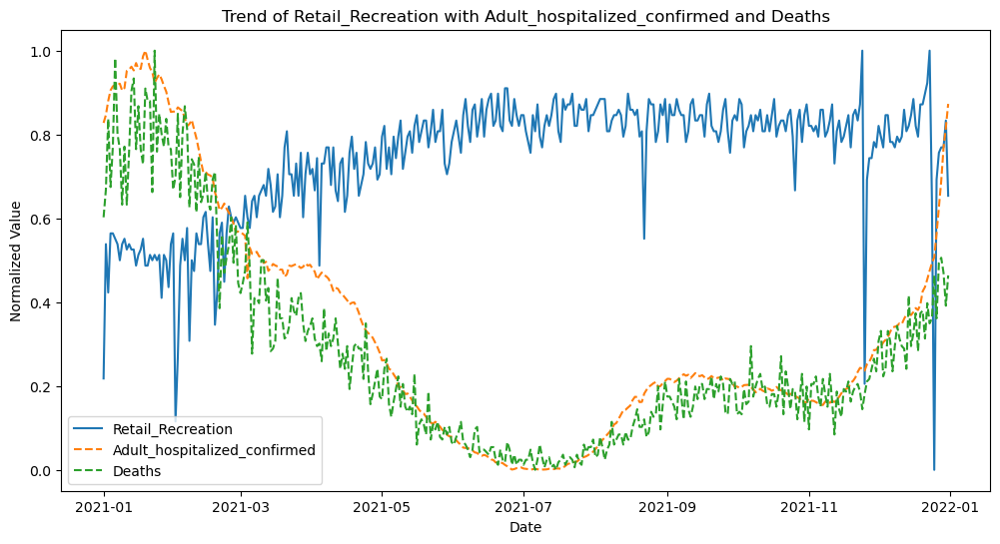

## Analysis of Retail_Recreation
This plot shows the trend of Retail_Recreation along with Adult_hospitalized_confirmed and Deaths.

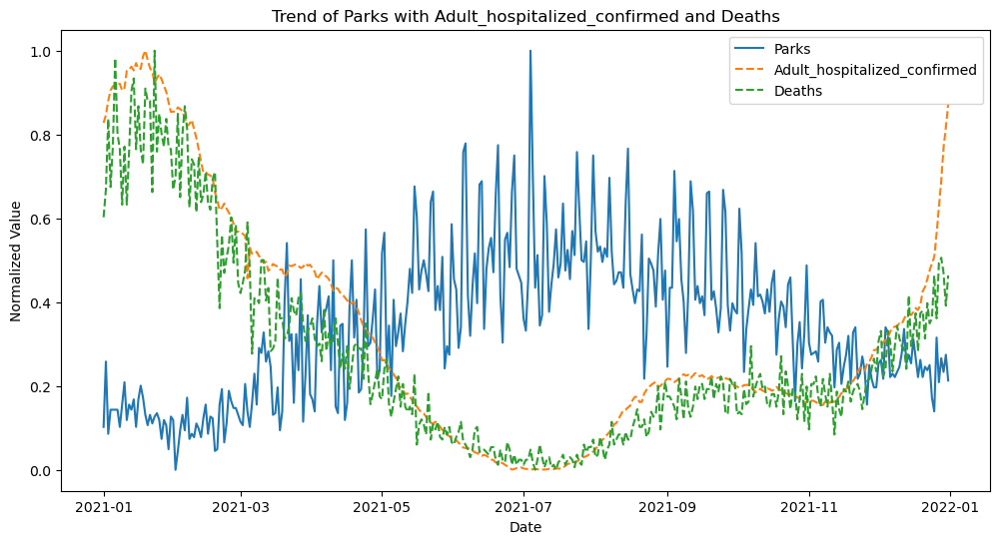

## Analysis of Parks
This plot shows the trend of Parks along with Adult_hospitalized_confirmed and Deaths.

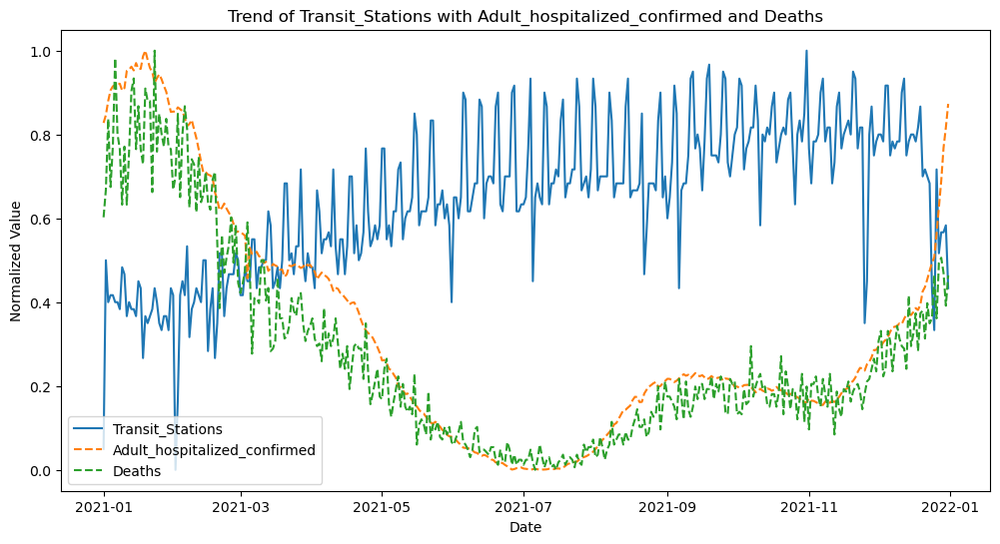

## Analysis of Transit_Stations
This plot shows the trend of Transit_Stations along with Adult_hospitalized_confirmed and Deaths.

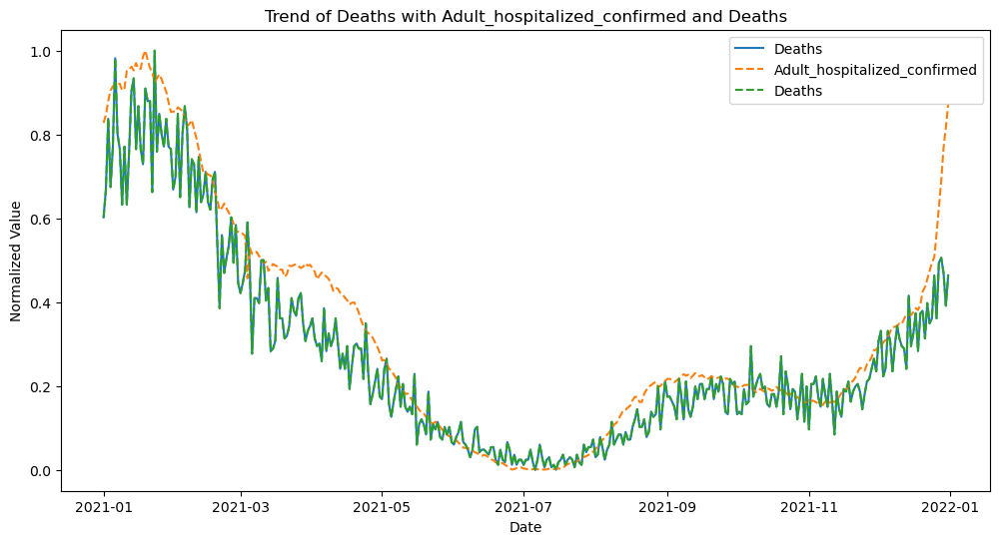

## Analysis of Deaths
This plot shows the trend of Deaths along with Adult_hospitalized_confirmed and Deaths.

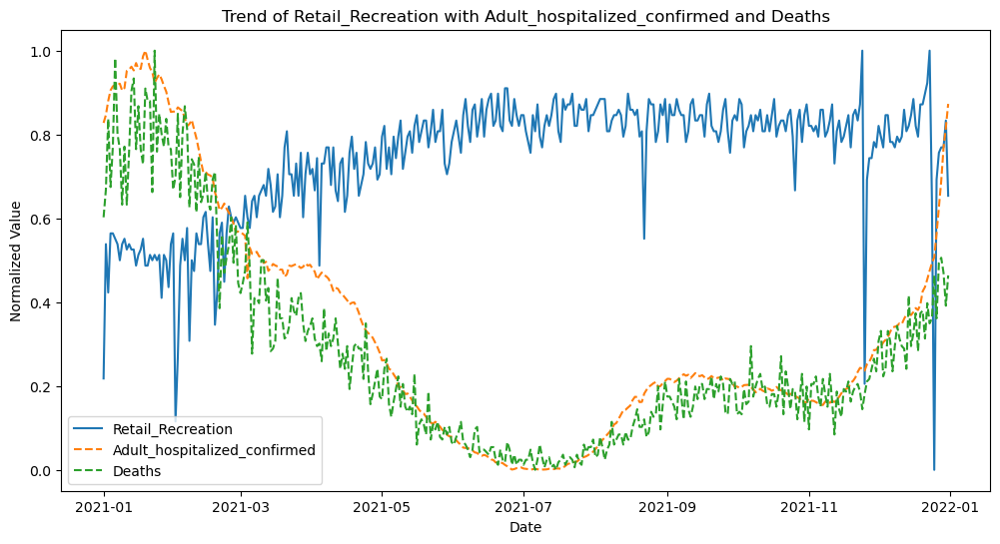

## Analysis of Retail_Recreation
This plot shows the trend of Retail_Recreation along with Adult_hospitalized_confirmed and Deaths.

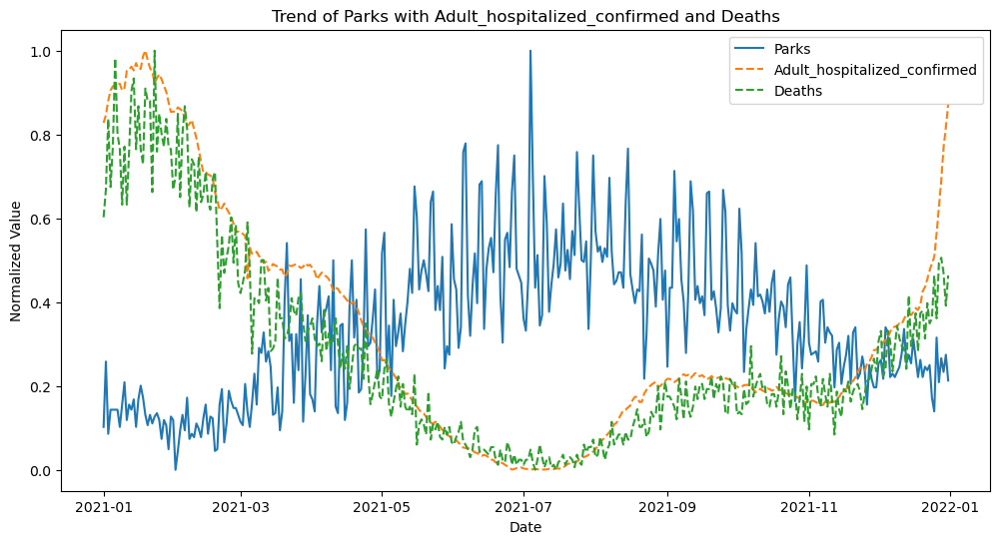

## Analysis of Parks
This plot shows the trend of Parks along with Adult_hospitalized_confirmed and Deaths.

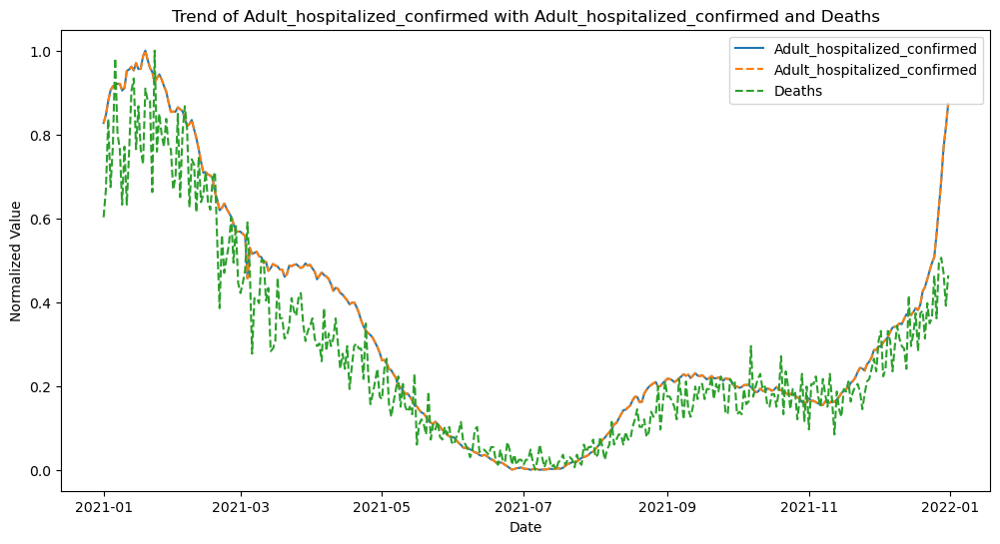

## Analysis of Adult_hospitalized_confirmed
This plot shows the trend of Adult_hospitalized_confirmed along with Adult_hospitalized_confirmed and Deaths.

In [11]:
# Plot trends for each data column separately
def plot(strong_list, df_merged):
    data_columns = [item[0] for item in strong_list]
    for column in data_columns:
        plt.figure(figsize=(12, 6))
        plt.plot(df_merged.index, df_merged[column], label=column)
        plt.plot(df_merged.index, df_merged['Adult_hospitalized_confirmed'], label='Adult_hospitalized_confirmed', linestyle='--')
        plt.plot(df_merged.index, df_merged['Deaths'], label='Deaths', linestyle='--')
        plt.xlabel('Date')
        plt.ylabel('Normalized Value')
        plt.title(f'Trend of {column} with Adult_hospitalized_confirmed and Deaths')
        plt.legend()
        plt.show()
        
        display(Markdown(f"## Analysis of {column}\nThis plot shows the trend of {column} along with Adult_hospitalized_confirmed and Deaths."))

plot(strong_confirmed, df_merged)
plot(strong_deaths, df_merged)